https://medium.com/@manoharmanok/implementing-dcgan-in-pytorch-using-the-celeba-dataset-a-comprehensive-guide-660e6e8e29d2

In [1]:
!pip install torch torchvision tqdm matplotlib numpy


  Using cached torch-2.5.0-cp310-cp310-manylinux1_x86_64.whl.metadata (28 kB)
  Using cached torchvision-0.20.0-cp310-cp310-manylinux1_x86_64.whl.metadata (6.1 kB)
  Using cached filelock-3.16.1-py3-none-any.whl.metadata (2.9 kB)
  Using cached networkx-3.4.2-py3-none-any.whl.metadata (6.3 kB)
  Using cached fsspec-2024.10.0-py3-none-any.whl.metadata (11 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-man

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from tqdm import tqdm
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import torchvision.utils as vutils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Subset
import numpy as np

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [4]:
LEARNING_RATE = 3e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 64
IMAGE_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 128
NUM_EPOCHS = 400
FEATURES_DISC = 64
FEATURES_GEN = 64

In [5]:
# Define the transformations
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Path to the folder containing Pablo Picasso's images
path = '_data/art/Picasso'

# Create a dataset for only the Pablo Picasso folder
dataset = datasets.ImageFolder(path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset=dataset, batch_size=BATCH_SIZE, shuffle=True)


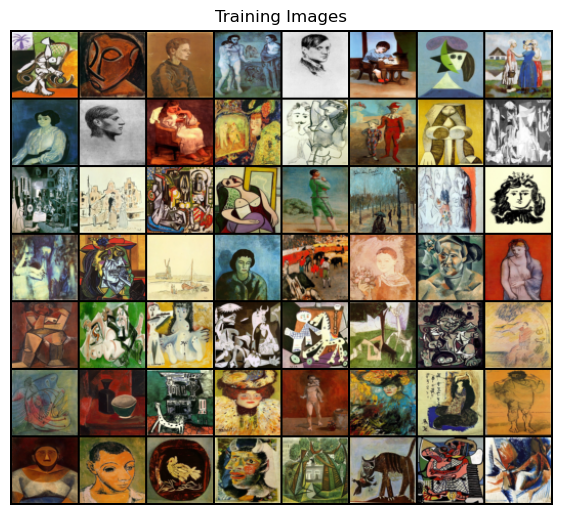

In [6]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(7,7))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:56], padding=2, normalize=True).cpu(),(1,2,0)))

### Generator

In [7]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(z_dim, features_g * 16, 4, 1, 0),  # 4x4
            nn.Upsample(scale_factor=2),  # Replace ConvTranspose with Upsample
            nn.Conv2d(features_g * 16, features_g * 8, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(features_g * 8),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(features_g * 8, features_g * 4, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(features_g * 4),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(features_g * 4, features_g * 2, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(features_g * 2),
            nn.ReLU(True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(features_g * 2, channels_img, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)


### Descriminator

In [8]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),  # Dropout to prevent overfitting
            self._block(features_d, features_d * 2, 4, 2, 1),
            nn.Dropout(0.3),  # Dropout to prevent overfitting
            self._block(features_d * 2, features_d * 4, 4, 2, 1),
            nn.Dropout(0.3),  # Dropout to prevent overfitting
            self._block(features_d * 4, features_d * 8, 4, 2, 1),
            nn.Conv2d(features_d * 8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.disc(x)


## Setting the Model

In [9]:
def initialize_weights(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

initialize_weights(gen)
initialize_weights(disc)

opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

In [10]:
def show_tensor_images(image_tensor, num_images=32, size=(1, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Start Training

Epoch [0/400] Batch 0/3                   Loss D: 0.7251, loss G: 1.6394 
 Disc Real Prob 0.6289265155792236 Disc Fake Prob 0.6319231390953064


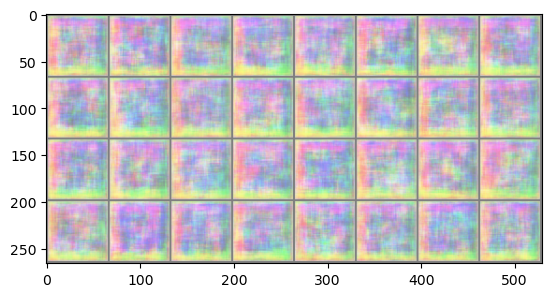

Epoch [1/400] Batch 0/3                   Loss D: 1.4875, loss G: 1.9790 
 Disc Real Prob 0.6270917057991028 Disc Fake Prob 0.7085810899734497
Epoch [2/400] Batch 0/3                   Loss D: 0.9027, loss G: 3.8390 
 Disc Real Prob 0.5898575186729431 Disc Fake Prob 0.621055543422699
Epoch [3/400] Batch 0/3                   Loss D: 1.6186, loss G: 2.7920 
 Disc Real Prob 0.6468155980110168 Disc Fake Prob 0.7067110538482666
Epoch [4/400] Batch 0/3                   Loss D: 0.8044, loss G: 2.9863 
 Disc Real Prob 0.5707115530967712 Disc Fake Prob 0.5355732440948486
Epoch [5/400] Batch 0/3                   Loss D: 0.9937, loss G: 4.6845 
 Disc Real Prob 0.6321794986724854 Disc Fake Prob 0.6588025689125061
Epoch [6/400] Batch 0/3                   Loss D: 0.5255, loss G: 3.7414 
 Disc Real Prob 0.62461256980896 Disc Fake Prob 0.5352104902267456
Epoch [7/400] Batch 0/3                   Loss D: 0.5162, loss G: 4.3096 
 Disc Real Prob 0.6661633253097534 Disc Fake Prob 0.5792022943496704
Ep

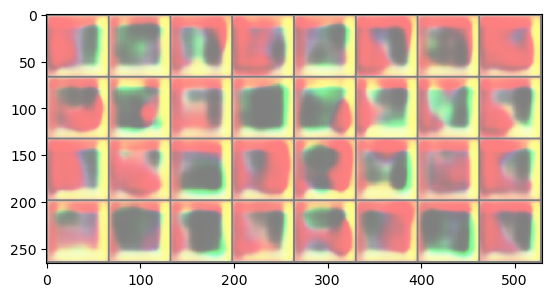

Epoch [11/400] Batch 0/3                   Loss D: 0.6925, loss G: 2.2853 
 Disc Real Prob 0.652156412601471 Disc Fake Prob 0.6146972179412842
Epoch [12/400] Batch 0/3                   Loss D: 0.7811, loss G: 2.2296 
 Disc Real Prob 0.6266424655914307 Disc Fake Prob 0.6044718623161316
Epoch [13/400] Batch 0/3                   Loss D: 0.8283, loss G: 1.8639 
 Disc Real Prob 0.6107645034790039 Disc Fake Prob 0.608348548412323
Epoch [14/400] Batch 0/3                   Loss D: 0.9304, loss G: 1.7022 
 Disc Real Prob 0.6102027893066406 Disc Fake Prob 0.6165808439254761
Epoch [15/400] Batch 0/3                   Loss D: 0.7669, loss G: 1.4078 
 Disc Real Prob 0.6435281038284302 Disc Fake Prob 0.6286495923995972
Epoch [16/400] Batch 0/3                   Loss D: 0.4619, loss G: 1.8501 
 Disc Real Prob 0.6420655250549316 Disc Fake Prob 0.5632911920547485
Epoch [17/400] Batch 0/3                   Loss D: 0.3831, loss G: 2.0162 
 Disc Real Prob 0.6785604953765869 Disc Fake Prob 0.58105814456

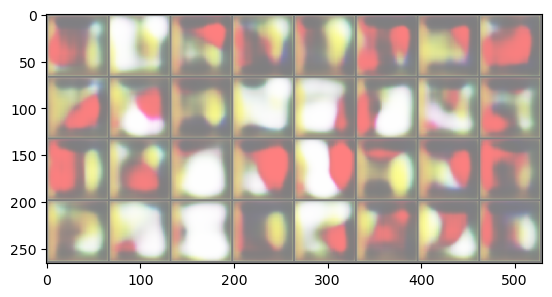

Epoch [21/400] Batch 0/3                   Loss D: 0.5446, loss G: 1.8169 
 Disc Real Prob 0.6555747985839844 Disc Fake Prob 0.5994686484336853
Epoch [22/400] Batch 0/3                   Loss D: 0.8069, loss G: 1.4831 
 Disc Real Prob 0.6193915605545044 Disc Fake Prob 0.6080160140991211
Epoch [23/400] Batch 0/3                   Loss D: 0.6011, loss G: 1.3403 
 Disc Real Prob 0.655555009841919 Disc Fake Prob 0.6103875041007996
Epoch [24/400] Batch 0/3                   Loss D: 0.5068, loss G: 1.4294 
 Disc Real Prob 0.6403926014900208 Disc Fake Prob 0.5710748434066772
Epoch [25/400] Batch 0/3                   Loss D: 0.4140, loss G: 1.5827 
 Disc Real Prob 0.6623021960258484 Disc Fake Prob 0.5738680362701416
Epoch [26/400] Batch 0/3                   Loss D: 0.4460, loss G: 1.6095 
 Disc Real Prob 0.6741262674331665 Disc Fake Prob 0.5917706489562988
Epoch [27/400] Batch 0/3                   Loss D: 0.5665, loss G: 1.4884 
 Disc Real Prob 0.6526254415512085 Disc Fake Prob 0.5960077047

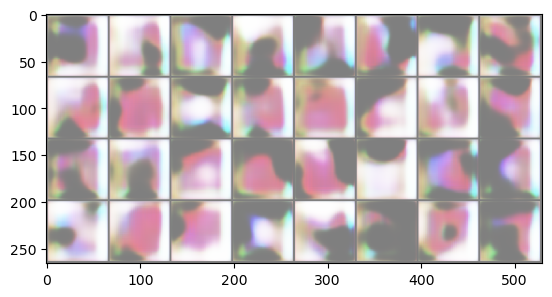

Epoch [31/400] Batch 0/3                   Loss D: 0.5376, loss G: 2.1754 
 Disc Real Prob 0.6510633230209351 Disc Fake Prob 0.5890043377876282
Epoch [32/400] Batch 0/3                   Loss D: 0.5930, loss G: 2.5037 
 Disc Real Prob 0.6612755656242371 Disc Fake Prob 0.610244870185852
Epoch [33/400] Batch 0/3                   Loss D: 0.6775, loss G: 1.9711 
 Disc Real Prob 0.6265065670013428 Disc Fake Prob 0.5859426856040955
Epoch [34/400] Batch 0/3                   Loss D: 0.7169, loss G: 1.7091 
 Disc Real Prob 0.6418406963348389 Disc Fake Prob 0.6261521577835083
Epoch [35/400] Batch 0/3                   Loss D: 0.2917, loss G: 2.4823 
 Disc Real Prob 0.6712016463279724 Disc Fake Prob 0.5470730066299438
Epoch [36/400] Batch 0/3                   Loss D: 0.3412, loss G: 2.0154 
 Disc Real Prob 0.6728161573410034 Disc Fake Prob 0.5621482729911804
Epoch [37/400] Batch 0/3                   Loss D: 0.4798, loss G: 2.1083 
 Disc Real Prob 0.6730623245239258 Disc Fake Prob 0.5966334342

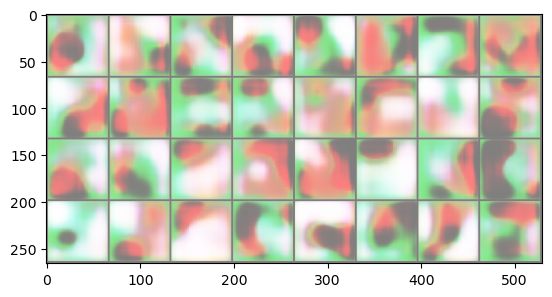

Epoch [41/400] Batch 0/3                   Loss D: 0.3798, loss G: 2.3093 
 Disc Real Prob 0.6438589096069336 Disc Fake Prob 0.5353781580924988
Epoch [42/400] Batch 0/3                   Loss D: 0.5063, loss G: 2.8065 
 Disc Real Prob 0.647239625453949 Disc Fake Prob 0.5756879448890686
Epoch [43/400] Batch 0/3                   Loss D: 0.4259, loss G: 2.7043 
 Disc Real Prob 0.6621725559234619 Disc Fake Prob 0.5702827572822571
Epoch [44/400] Batch 0/3                   Loss D: 0.4503, loss G: 2.3949 
 Disc Real Prob 0.6511728763580322 Disc Fake Prob 0.5654847621917725
Epoch [45/400] Batch 0/3                   Loss D: 0.3266, loss G: 2.9476 
 Disc Real Prob 0.6661391258239746 Disc Fake Prob 0.541467547416687
Epoch [46/400] Batch 0/3                   Loss D: 0.4472, loss G: 2.4013 
 Disc Real Prob 0.6462629437446594 Disc Fake Prob 0.5570531487464905
Epoch [47/400] Batch 0/3                   Loss D: 0.3614, loss G: 2.5231 
 Disc Real Prob 0.6787828207015991 Disc Fake Prob 0.57123041152

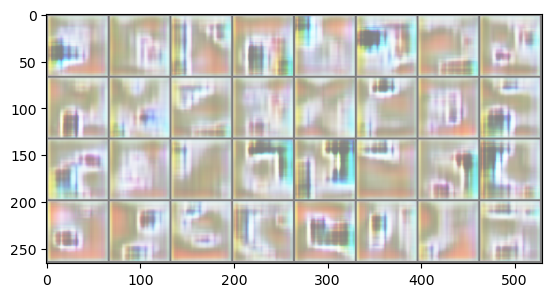

Epoch [51/400] Batch 0/3                   Loss D: 0.6227, loss G: 2.8978 
 Disc Real Prob 0.6314986944198608 Disc Fake Prob 0.5845836400985718
Epoch [52/400] Batch 0/3                   Loss D: 0.4905, loss G: 2.6845 
 Disc Real Prob 0.6661808490753174 Disc Fake Prob 0.5905997157096863
Epoch [53/400] Batch 0/3                   Loss D: 0.4551, loss G: 2.3058 
 Disc Real Prob 0.6678863167762756 Disc Fake Prob 0.5833117365837097
Epoch [54/400] Batch 0/3                   Loss D: 0.5281, loss G: 2.1168 
 Disc Real Prob 0.6377878189086914 Disc Fake Prob 0.5621888637542725
Epoch [55/400] Batch 0/3                   Loss D: 0.4417, loss G: 1.7873 
 Disc Real Prob 0.6500481367111206 Disc Fake Prob 0.5611608624458313
Epoch [56/400] Batch 0/3                   Loss D: 0.5280, loss G: 2.5069 
 Disc Real Prob 0.6488324403762817 Disc Fake Prob 0.5856692790985107
Epoch [57/400] Batch 0/3                   Loss D: 0.3609, loss G: 2.6743 
 Disc Real Prob 0.6712830662727356 Disc Fake Prob 0.564227640

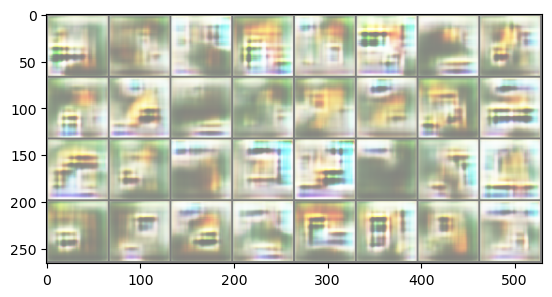

Epoch [61/400] Batch 0/3                   Loss D: 0.5401, loss G: 3.0263 
 Disc Real Prob 0.6850975751876831 Disc Fake Prob 0.6162857413291931
Epoch [62/400] Batch 0/3                   Loss D: 0.7149, loss G: 2.7560 
 Disc Real Prob 0.660837709903717 Disc Fake Prob 0.6372436881065369
Epoch [63/400] Batch 0/3                   Loss D: 0.7093, loss G: 2.2734 
 Disc Real Prob 0.6432859301567078 Disc Fake Prob 0.6191450357437134
Epoch [64/400] Batch 0/3                   Loss D: 0.5366, loss G: 1.9123 
 Disc Real Prob 0.6484938859939575 Disc Fake Prob 0.5872088670730591
Epoch [65/400] Batch 0/3                   Loss D: 0.6201, loss G: 2.4794 
 Disc Real Prob 0.6779851913452148 Disc Fake Prob 0.6340622901916504
Epoch [66/400] Batch 0/3                   Loss D: 0.4468, loss G: 2.1411 
 Disc Real Prob 0.6787453889846802 Disc Fake Prob 0.5886922478675842
Epoch [67/400] Batch 0/3                   Loss D: 0.4780, loss G: 1.9699 
 Disc Real Prob 0.6571201086044312 Disc Fake Prob 0.5771411657

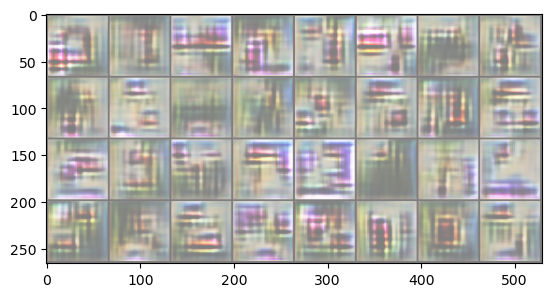

Epoch [71/400] Batch 0/3                   Loss D: 0.7039, loss G: 1.7526 
 Disc Real Prob 0.6755363941192627 Disc Fake Prob 0.6440171003341675
Epoch [72/400] Batch 0/3                   Loss D: 0.4088, loss G: 1.6455 
 Disc Real Prob 0.6587697267532349 Disc Fake Prob 0.5647649765014648
Epoch [73/400] Batch 0/3                   Loss D: 0.5984, loss G: 2.4250 
 Disc Real Prob 0.6587262749671936 Disc Fake Prob 0.6098465919494629
Epoch [74/400] Batch 0/3                   Loss D: 0.6713, loss G: 2.0016 
 Disc Real Prob 0.636204183101654 Disc Fake Prob 0.5981454849243164
Epoch [75/400] Batch 0/3                   Loss D: 0.7244, loss G: 2.0709 
 Disc Real Prob 0.625615656375885 Disc Fake Prob 0.6033971309661865
Epoch [76/400] Batch 0/3                   Loss D: 0.7781, loss G: 2.3088 
 Disc Real Prob 0.6173632144927979 Disc Fake Prob 0.6105301380157471
Epoch [77/400] Batch 0/3                   Loss D: 0.4337, loss G: 2.3824 
 Disc Real Prob 0.6621840596199036 Disc Fake Prob 0.57407099008

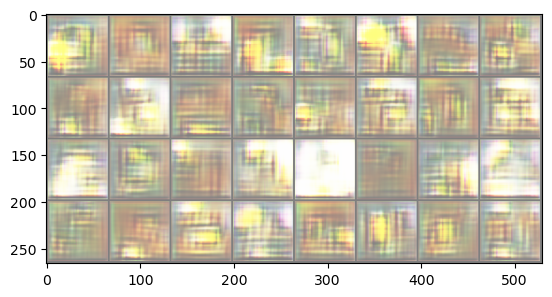

Epoch [81/400] Batch 0/3                   Loss D: 0.5434, loss G: 2.3768 
 Disc Real Prob 0.6589584350585938 Disc Fake Prob 0.5980829000473022
Epoch [82/400] Batch 0/3                   Loss D: 0.5415, loss G: 2.6492 
 Disc Real Prob 0.6961090564727783 Disc Fake Prob 0.6276884078979492
Epoch [83/400] Batch 0/3                   Loss D: 0.5547, loss G: 1.8399 
 Disc Real Prob 0.6589608788490295 Disc Fake Prob 0.5997132062911987
Epoch [84/400] Batch 0/3                   Loss D: 0.7207, loss G: 2.0461 
 Disc Real Prob 0.6215990781784058 Disc Fake Prob 0.5835907459259033
Epoch [85/400] Batch 0/3                   Loss D: 0.6353, loss G: 2.2382 
 Disc Real Prob 0.6220612525939941 Disc Fake Prob 0.5732033848762512
Epoch [86/400] Batch 0/3                   Loss D: 0.4911, loss G: 2.4343 
 Disc Real Prob 0.637984037399292 Disc Fake Prob 0.5574488043785095
Epoch [87/400] Batch 0/3                   Loss D: 0.6817, loss G: 1.9553 
 Disc Real Prob 0.6375372409820557 Disc Fake Prob 0.6050926446

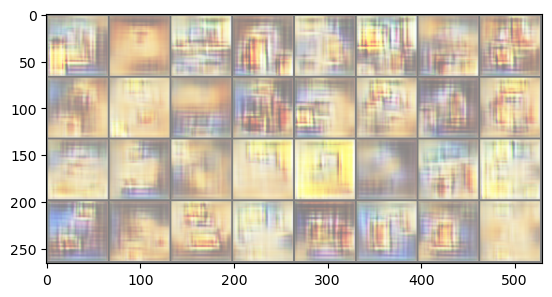

Epoch [91/400] Batch 0/3                   Loss D: 0.8695, loss G: 1.4988 
 Disc Real Prob 0.6099278330802917 Disc Fake Prob 0.6166626214981079
Epoch [92/400] Batch 0/3                   Loss D: 0.6601, loss G: 1.5834 
 Disc Real Prob 0.6027646660804749 Disc Fake Prob 0.559411883354187
Epoch [93/400] Batch 0/3                   Loss D: 0.6221, loss G: 1.8542 
 Disc Real Prob 0.6442112922668457 Disc Fake Prob 0.6036794781684875
Epoch [94/400] Batch 0/3                   Loss D: 0.5751, loss G: 1.8476 
 Disc Real Prob 0.6487264633178711 Disc Fake Prob 0.6025233268737793
Epoch [95/400] Batch 0/3                   Loss D: 0.6146, loss G: 1.8859 
 Disc Real Prob 0.6385124325752258 Disc Fake Prob 0.5977609157562256
Epoch [96/400] Batch 0/3                   Loss D: 0.4843, loss G: 2.2112 
 Disc Real Prob 0.6565893888473511 Disc Fake Prob 0.583768367767334
Epoch [97/400] Batch 0/3                   Loss D: 0.5053, loss G: 1.7464 
 Disc Real Prob 0.643394947052002 Disc Fake Prob 0.579319775104

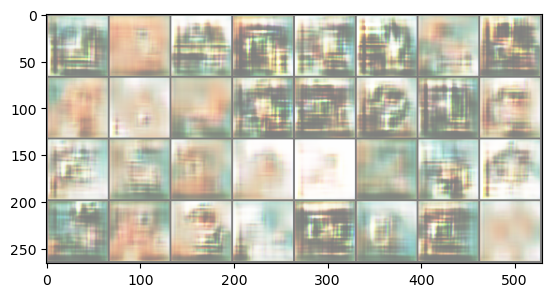

Epoch [101/400] Batch 0/3                   Loss D: 0.8433, loss G: 2.0292 
 Disc Real Prob 0.6956977248191833 Disc Fake Prob 0.6754922866821289
Epoch [102/400] Batch 0/3                   Loss D: 0.7889, loss G: 2.1239 
 Disc Real Prob 0.6688376665115356 Disc Fake Prob 0.6536152958869934
Epoch [103/400] Batch 0/3                   Loss D: 0.6798, loss G: 2.1215 
 Disc Real Prob 0.6405280232429504 Disc Fake Prob 0.6138862371444702
Epoch [104/400] Batch 0/3                   Loss D: 0.7846, loss G: 1.9473 
 Disc Real Prob 0.6589068174362183 Disc Fake Prob 0.6509618759155273
Epoch [105/400] Batch 0/3                   Loss D: 0.6157, loss G: 1.9767 
 Disc Real Prob 0.629736602306366 Disc Fake Prob 0.5902427434921265
Epoch [106/400] Batch 0/3                   Loss D: 0.4999, loss G: 1.9446 
 Disc Real Prob 0.6227766275405884 Disc Fake Prob 0.5472704172134399
Epoch [107/400] Batch 0/3                   Loss D: 0.6392, loss G: 2.3223 
 Disc Real Prob 0.6335013508796692 Disc Fake Prob 0.597

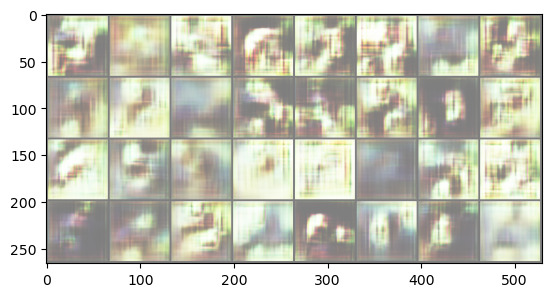

Epoch [111/400] Batch 0/3                   Loss D: 0.5543, loss G: 2.2226 
 Disc Real Prob 0.6401789784431458 Disc Fake Prob 0.5845524072647095
Epoch [112/400] Batch 0/3                   Loss D: 0.6005, loss G: 2.3768 
 Disc Real Prob 0.6721306443214417 Disc Fake Prob 0.6241474747657776
Epoch [113/400] Batch 0/3                   Loss D: 0.7285, loss G: 2.1858 
 Disc Real Prob 0.6503615379333496 Disc Fake Prob 0.6322527527809143
Epoch [114/400] Batch 0/3                   Loss D: 0.7718, loss G: 1.9680 
 Disc Real Prob 0.6429532766342163 Disc Fake Prob 0.6320310831069946
Epoch [115/400] Batch 0/3                   Loss D: 0.7366, loss G: 1.8127 
 Disc Real Prob 0.6143070459365845 Disc Fake Prob 0.5955489873886108
Epoch [116/400] Batch 0/3                   Loss D: 0.6355, loss G: 2.1967 
 Disc Real Prob 0.664980411529541 Disc Fake Prob 0.6298449039459229
Epoch [117/400] Batch 0/3                   Loss D: 0.5496, loss G: 1.6636 
 Disc Real Prob 0.6653305888175964 Disc Fake Prob 0.611

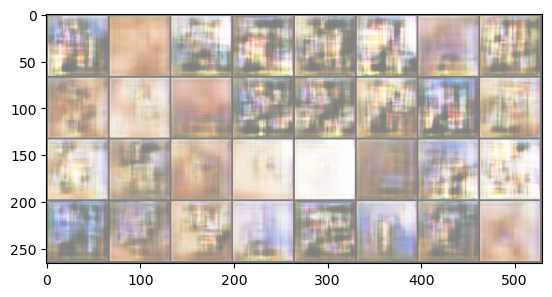

Epoch [121/400] Batch 0/3                   Loss D: 0.6380, loss G: 1.8917 
 Disc Real Prob 0.634798526763916 Disc Fake Prob 0.5996180176734924
Epoch [122/400] Batch 0/3                   Loss D: 0.7717, loss G: 2.6561 
 Disc Real Prob 0.6313899755477905 Disc Fake Prob 0.621761679649353
Epoch [123/400] Batch 0/3                   Loss D: 0.6822, loss G: 1.9604 
 Disc Real Prob 0.6445606350898743 Disc Fake Prob 0.6228085160255432
Epoch [124/400] Batch 0/3                   Loss D: 0.6474, loss G: 1.6467 
 Disc Real Prob 0.631300687789917 Disc Fake Prob 0.6049039363861084
Epoch [125/400] Batch 0/3                   Loss D: 0.7475, loss G: 2.2515 
 Disc Real Prob 0.636951208114624 Disc Fake Prob 0.62578284740448
Epoch [126/400] Batch 0/3                   Loss D: 0.6564, loss G: 1.9815 
 Disc Real Prob 0.6420236825942993 Disc Fake Prob 0.6180888414382935
Epoch [127/400] Batch 0/3                   Loss D: 0.7405, loss G: 2.0158 
 Disc Real Prob 0.6546427011489868 Disc Fake Prob 0.64182722

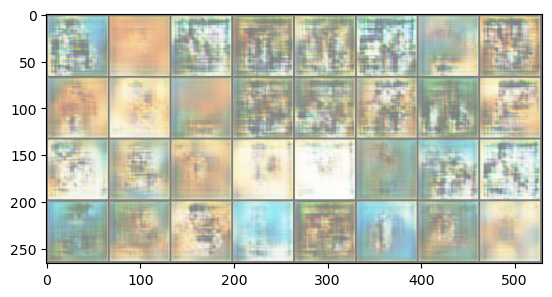

Epoch [131/400] Batch 0/3                   Loss D: 0.7488, loss G: 1.6303 
 Disc Real Prob 0.6533204317092896 Disc Fake Prob 0.6455966830253601
Epoch [132/400] Batch 0/3                   Loss D: 0.8308, loss G: 1.5965 
 Disc Real Prob 0.6067424416542053 Disc Fake Prob 0.615820050239563
Epoch [133/400] Batch 0/3                   Loss D: 0.6519, loss G: 2.0777 
 Disc Real Prob 0.6621135473251343 Disc Fake Prob 0.63364577293396
Epoch [134/400] Batch 0/3                   Loss D: 0.7475, loss G: 1.5081 
 Disc Real Prob 0.6338647603988647 Disc Fake Prob 0.62740159034729
Epoch [135/400] Batch 0/3                   Loss D: 0.6645, loss G: 1.3592 
 Disc Real Prob 0.6530708074569702 Disc Fake Prob 0.6284189224243164
Epoch [136/400] Batch 0/3                   Loss D: 0.6739, loss G: 1.4571 
 Disc Real Prob 0.6182509064674377 Disc Fake Prob 0.5975508689880371
Epoch [137/400] Batch 0/3                   Loss D: 0.6754, loss G: 1.8736 
 Disc Real Prob 0.6505275964736938 Disc Fake Prob 0.6303972

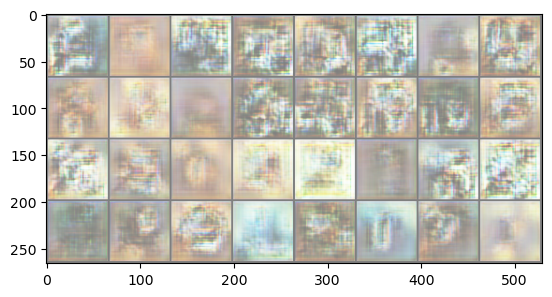

Epoch [141/400] Batch 0/3                   Loss D: 0.6451, loss G: 1.3730 
 Disc Real Prob 0.640917181968689 Disc Fake Prob 0.6149393320083618
Epoch [142/400] Batch 0/3                   Loss D: 0.8861, loss G: 1.1972 
 Disc Real Prob 0.6033235788345337 Disc Fake Prob 0.6210684776306152
Epoch [143/400] Batch 0/3                   Loss D: 0.6706, loss G: 1.4514 
 Disc Real Prob 0.6264944076538086 Disc Fake Prob 0.6072894334793091
Epoch [144/400] Batch 0/3                   Loss D: 0.7779, loss G: 1.6537 
 Disc Real Prob 0.6207346320152283 Disc Fake Prob 0.6205441951751709
Epoch [145/400] Batch 0/3                   Loss D: 0.7539, loss G: 1.5714 
 Disc Real Prob 0.662319004535675 Disc Fake Prob 0.6525348424911499
Epoch [146/400] Batch 0/3                   Loss D: 0.7911, loss G: 1.1841 
 Disc Real Prob 0.630258321762085 Disc Fake Prob 0.6374964118003845
Epoch [147/400] Batch 0/3                   Loss D: 0.6407, loss G: 1.5369 
 Disc Real Prob 0.6456717848777771 Disc Fake Prob 0.62167

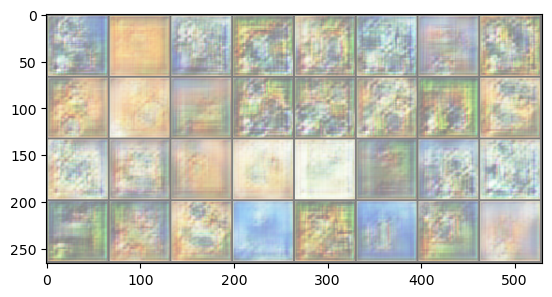

Epoch [151/400] Batch 0/3                   Loss D: 0.6257, loss G: 1.4114 
 Disc Real Prob 0.6812162399291992 Disc Fake Prob 0.644227147102356
Epoch [152/400] Batch 0/3                   Loss D: 0.5650, loss G: 1.4006 
 Disc Real Prob 0.6486977934837341 Disc Fake Prob 0.6076890826225281
Epoch [153/400] Batch 0/3                   Loss D: 0.6244, loss G: 1.4274 
 Disc Real Prob 0.628751277923584 Disc Fake Prob 0.6011277437210083
Epoch [154/400] Batch 0/3                   Loss D: 0.6685, loss G: 1.5224 
 Disc Real Prob 0.6346720457077026 Disc Fake Prob 0.6148550510406494
Epoch [155/400] Batch 0/3                   Loss D: 0.6854, loss G: 1.5530 
 Disc Real Prob 0.6394767761230469 Disc Fake Prob 0.625960111618042
Epoch [156/400] Batch 0/3                   Loss D: 0.6469, loss G: 1.5059 
 Disc Real Prob 0.6370412111282349 Disc Fake Prob 0.6144483089447021
Epoch [157/400] Batch 0/3                   Loss D: 0.6813, loss G: 1.4750 
 Disc Real Prob 0.621902346611023 Disc Fake Prob 0.606310

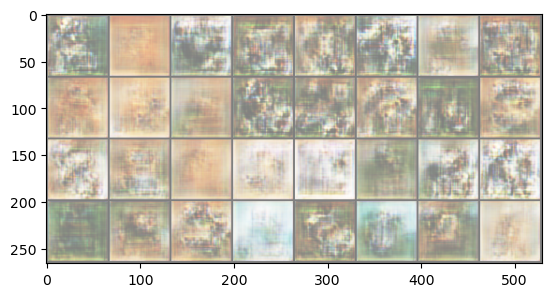

Epoch [161/400] Batch 0/3                   Loss D: 0.7301, loss G: 1.4733 
 Disc Real Prob 0.6523644924163818 Disc Fake Prob 0.643211305141449
Epoch [162/400] Batch 0/3                   Loss D: 0.6713, loss G: 1.3779 
 Disc Real Prob 0.6214370727539062 Disc Fake Prob 0.6028202772140503
Epoch [163/400] Batch 0/3                   Loss D: 0.6754, loss G: 1.3747 
 Disc Real Prob 0.6189171671867371 Disc Fake Prob 0.601513147354126
Epoch [164/400] Batch 0/3                   Loss D: 0.7076, loss G: 1.5686 
 Disc Real Prob 0.6468883752822876 Disc Fake Prob 0.6346901655197144
Epoch [165/400] Batch 0/3                   Loss D: 0.7082, loss G: 1.4857 
 Disc Real Prob 0.6175088882446289 Disc Fake Prob 0.6088691353797913
Epoch [166/400] Batch 0/3                   Loss D: 0.6207, loss G: 1.6655 
 Disc Real Prob 0.6676607131958008 Disc Fake Prob 0.6352556943893433
Epoch [167/400] Batch 0/3                   Loss D: 0.7891, loss G: 1.4442 
 Disc Real Prob 0.6160075068473816 Disc Fake Prob 0.6240

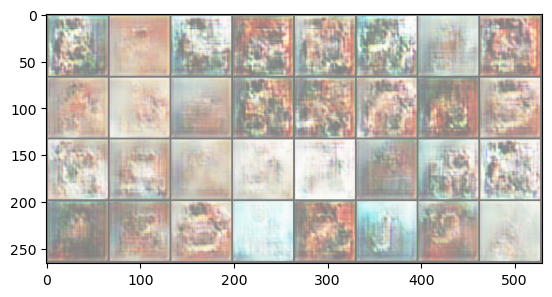

Epoch [171/400] Batch 0/3                   Loss D: 0.6015, loss G: 1.7400 
 Disc Real Prob 0.6474775671958923 Disc Fake Prob 0.6151915788650513
Epoch [172/400] Batch 0/3                   Loss D: 0.7228, loss G: 1.5368 
 Disc Real Prob 0.6269820928573608 Disc Fake Prob 0.6202579736709595
Epoch [173/400] Batch 0/3                   Loss D: 0.6403, loss G: 1.5665 
 Disc Real Prob 0.6460314989089966 Disc Fake Prob 0.623179018497467
Epoch [174/400] Batch 0/3                   Loss D: 0.6385, loss G: 1.4487 
 Disc Real Prob 0.6390500068664551 Disc Fake Prob 0.6156731843948364
Epoch [175/400] Batch 0/3                   Loss D: 0.6101, loss G: 1.6121 
 Disc Real Prob 0.6492335796356201 Disc Fake Prob 0.6173840761184692
Epoch [176/400] Batch 0/3                   Loss D: 0.6085, loss G: 1.6172 
 Disc Real Prob 0.6455564498901367 Disc Fake Prob 0.6140801906585693
Epoch [177/400] Batch 0/3                   Loss D: 0.5728, loss G: 1.5482 
 Disc Real Prob 0.633266031742096 Disc Fake Prob 0.5933

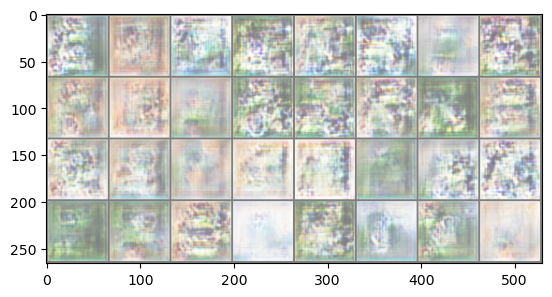

Epoch [181/400] Batch 0/3                   Loss D: 0.6495, loss G: 1.4229 
 Disc Real Prob 0.6356962323188782 Disc Fake Prob 0.6141258478164673
Epoch [182/400] Batch 0/3                   Loss D: 0.5996, loss G: 1.8191 
 Disc Real Prob 0.6302182674407959 Disc Fake Prob 0.5943963527679443
Epoch [183/400] Batch 0/3                   Loss D: 0.7019, loss G: 1.7727 
 Disc Real Prob 0.6557651162147522 Disc Fake Prob 0.6396839618682861
Epoch [184/400] Batch 0/3                   Loss D: 0.6246, loss G: 1.5578 
 Disc Real Prob 0.6436808705329895 Disc Fake Prob 0.6159435510635376
Epoch [185/400] Batch 0/3                   Loss D: 0.5678, loss G: 1.8634 
 Disc Real Prob 0.6553167104721069 Disc Fake Prob 0.6122678518295288
Epoch [186/400] Batch 0/3                   Loss D: 0.7121, loss G: 1.3665 
 Disc Real Prob 0.6522150039672852 Disc Fake Prob 0.6404308676719666
Epoch [187/400] Batch 0/3                   Loss D: 0.6843, loss G: 1.2052 
 Disc Real Prob 0.6439622640609741 Disc Fake Prob 0.62

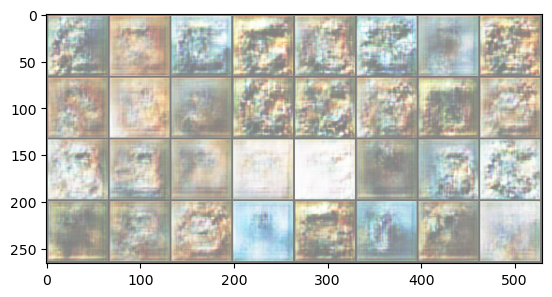

Epoch [191/400] Batch 0/3                   Loss D: 0.6867, loss G: 1.7147 
 Disc Real Prob 0.6608239412307739 Disc Fake Prob 0.6389811038970947
Epoch [192/400] Batch 0/3                   Loss D: 0.6869, loss G: 1.3119 
 Disc Real Prob 0.644823431968689 Disc Fake Prob 0.6302002668380737
Epoch [193/400] Batch 0/3                   Loss D: 0.5729, loss G: 1.8362 
 Disc Real Prob 0.6697820425033569 Disc Fake Prob 0.6259541511535645
Epoch [194/400] Batch 0/3                   Loss D: 0.5372, loss G: 1.4427 
 Disc Real Prob 0.6491491198539734 Disc Fake Prob 0.6008538007736206
Epoch [195/400] Batch 0/3                   Loss D: 0.5876, loss G: 1.5932 
 Disc Real Prob 0.6395665407180786 Disc Fake Prob 0.5996538400650024
Epoch [196/400] Batch 0/3                   Loss D: 0.5747, loss G: 1.6730 
 Disc Real Prob 0.6336314678192139 Disc Fake Prob 0.5887660980224609
Epoch [197/400] Batch 0/3                   Loss D: 0.5456, loss G: 1.6721 
 Disc Real Prob 0.6362812519073486 Disc Fake Prob 0.586

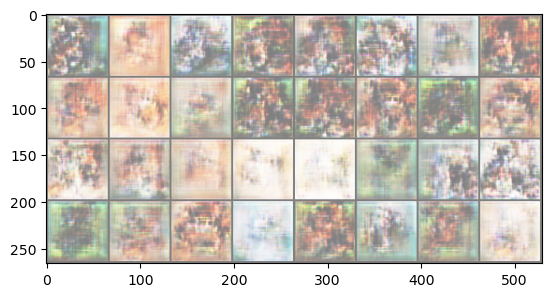

Epoch [201/400] Batch 0/3                   Loss D: 0.6398, loss G: 1.7997 
 Disc Real Prob 0.6254268884658813 Disc Fake Prob 0.5959222912788391
Epoch [202/400] Batch 0/3                   Loss D: 0.6010, loss G: 1.7993 
 Disc Real Prob 0.6526014804840088 Disc Fake Prob 0.6185189485549927
Epoch [203/400] Batch 0/3                   Loss D: 0.5953, loss G: 1.7092 
 Disc Real Prob 0.6617646217346191 Disc Fake Prob 0.6245797872543335
Epoch [204/400] Batch 0/3                   Loss D: 0.6259, loss G: 1.2091 
 Disc Real Prob 0.6722356677055359 Disc Fake Prob 0.6362645626068115
Epoch [205/400] Batch 0/3                   Loss D: 0.6604, loss G: 1.5531 
 Disc Real Prob 0.6199068427085876 Disc Fake Prob 0.5970758199691772
Epoch [206/400] Batch 0/3                   Loss D: 0.5878, loss G: 1.9203 
 Disc Real Prob 0.6436253190040588 Disc Fake Prob 0.6054931879043579
Epoch [207/400] Batch 0/3                   Loss D: 0.7667, loss G: 1.7409 
 Disc Real Prob 0.6122899055480957 Disc Fake Prob 0.61

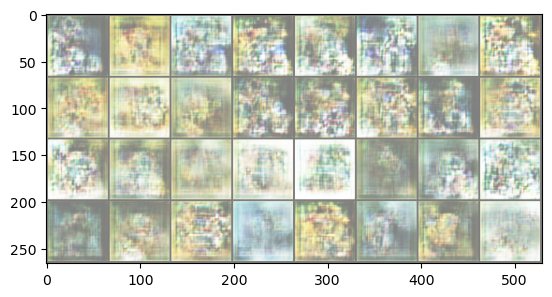

Epoch [211/400] Batch 0/3                   Loss D: 0.6710, loss G: 2.0490 
 Disc Real Prob 0.639026403427124 Disc Fake Prob 0.6172189116477966
Epoch [212/400] Batch 0/3                   Loss D: 0.6311, loss G: 1.7740 
 Disc Real Prob 0.650795042514801 Disc Fake Prob 0.6207879781723022
Epoch [213/400] Batch 0/3                   Loss D: 0.5753, loss G: 1.7756 
 Disc Real Prob 0.6296449899673462 Disc Fake Prob 0.5871958136558533
Epoch [214/400] Batch 0/3                   Loss D: 0.5703, loss G: 1.6872 
 Disc Real Prob 0.6528897881507874 Disc Fake Prob 0.6105069518089294
Epoch [215/400] Batch 0/3                   Loss D: 0.5808, loss G: 1.9606 
 Disc Real Prob 0.6766303181648254 Disc Fake Prob 0.6324270367622375
Epoch [216/400] Batch 0/3                   Loss D: 0.6184, loss G: 1.5157 
 Disc Real Prob 0.638547956943512 Disc Fake Prob 0.6083564758300781
Epoch [217/400] Batch 0/3                   Loss D: 0.5746, loss G: 1.6595 
 Disc Real Prob 0.6394372582435608 Disc Fake Prob 0.59968

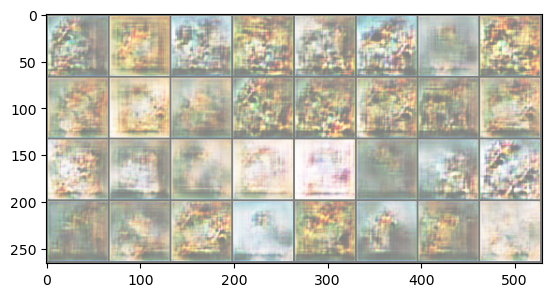

Epoch [221/400] Batch 0/3                   Loss D: 0.5502, loss G: 1.9306 
 Disc Real Prob 0.6459752321243286 Disc Fake Prob 0.5995750427246094
Epoch [222/400] Batch 0/3                   Loss D: 0.6116, loss G: 1.7446 
 Disc Real Prob 0.6399582624435425 Disc Fake Prob 0.6089794635772705
Epoch [223/400] Batch 0/3                   Loss D: 0.7142, loss G: 1.7386 
 Disc Real Prob 0.6272603273391724 Disc Fake Prob 0.6136242151260376
Epoch [224/400] Batch 0/3                   Loss D: 0.7080, loss G: 1.4530 
 Disc Real Prob 0.6108436584472656 Disc Fake Prob 0.5952534675598145
Epoch [225/400] Batch 0/3                   Loss D: 0.6098, loss G: 1.8189 
 Disc Real Prob 0.6299060583114624 Disc Fake Prob 0.5962995886802673
Epoch [226/400] Batch 0/3                   Loss D: 0.5954, loss G: 2.0677 
 Disc Real Prob 0.6675271987915039 Disc Fake Prob 0.6276865005493164
Epoch [227/400] Batch 0/3                   Loss D: 0.6187, loss G: 1.4122 
 Disc Real Prob 0.6320987939834595 Disc Fake Prob 0.60

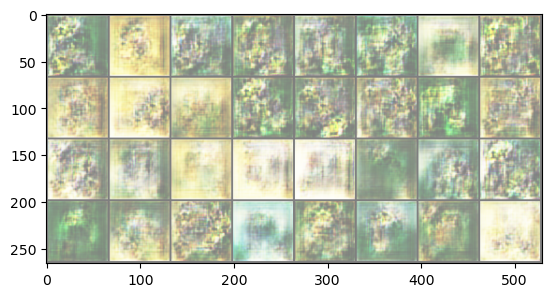

Epoch [231/400] Batch 0/3                   Loss D: 0.5204, loss G: 1.6979 
 Disc Real Prob 0.6441985368728638 Disc Fake Prob 0.5889675617218018
Epoch [232/400] Batch 0/3                   Loss D: 0.6498, loss G: 1.9858 
 Disc Real Prob 0.6284234523773193 Disc Fake Prob 0.6036685705184937
Epoch [233/400] Batch 0/3                   Loss D: 0.5262, loss G: 1.9548 
 Disc Real Prob 0.658638596534729 Disc Fake Prob 0.6059112548828125
Epoch [234/400] Batch 0/3                   Loss D: 0.6629, loss G: 2.0058 
 Disc Real Prob 0.6524558067321777 Disc Fake Prob 0.6309783458709717
Epoch [235/400] Batch 0/3                   Loss D: 0.6701, loss G: 2.0756 
 Disc Real Prob 0.6666964292526245 Disc Fake Prob 0.6397473216056824
Epoch [236/400] Batch 0/3                   Loss D: 0.5933, loss G: 2.0319 
 Disc Real Prob 0.6424570083618164 Disc Fake Prob 0.5998563170433044
Epoch [237/400] Batch 0/3                   Loss D: 0.5676, loss G: 1.9610 
 Disc Real Prob 0.6534513235092163 Disc Fake Prob 0.610

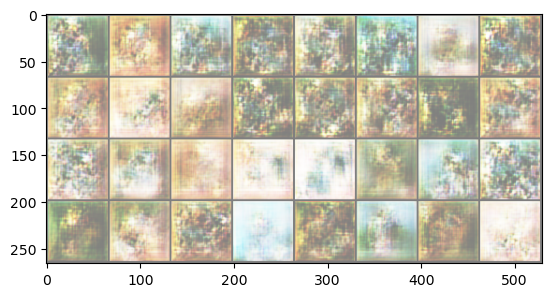

Epoch [241/400] Batch 0/3                   Loss D: 0.6103, loss G: 1.8526 
 Disc Real Prob 0.6435564160346985 Disc Fake Prob 0.6131810545921326
Epoch [242/400] Batch 0/3                   Loss D: 0.6519, loss G: 2.4112 
 Disc Real Prob 0.6663932800292969 Disc Fake Prob 0.6340524554252625
Epoch [243/400] Batch 0/3                   Loss D: 0.6560, loss G: 1.9943 
 Disc Real Prob 0.6695427894592285 Disc Fake Prob 0.6381853818893433
Epoch [244/400] Batch 0/3                   Loss D: 0.5444, loss G: 2.0528 
 Disc Real Prob 0.6421270370483398 Disc Fake Prob 0.5881166458129883
Epoch [245/400] Batch 0/3                   Loss D: 0.6417, loss G: 2.1527 
 Disc Real Prob 0.670569658279419 Disc Fake Prob 0.6359316110610962
Epoch [246/400] Batch 0/3                   Loss D: 0.6843, loss G: 1.7965 
 Disc Real Prob 0.6647747159004211 Disc Fake Prob 0.6394540071487427
Epoch [247/400] Batch 0/3                   Loss D: 0.7021, loss G: 2.1034 
 Disc Real Prob 0.6434152126312256 Disc Fake Prob 0.627

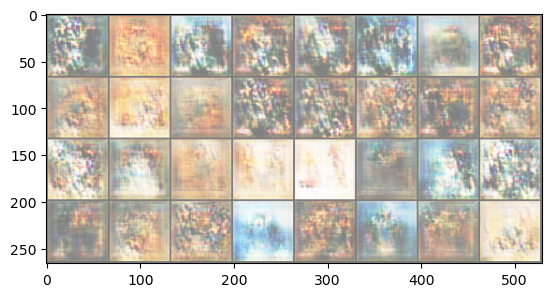

Epoch [251/400] Batch 0/3                   Loss D: 0.5350, loss G: 1.8604 
 Disc Real Prob 0.6656684875488281 Disc Fake Prob 0.6118806600570679
Epoch [252/400] Batch 0/3                   Loss D: 0.6493, loss G: 2.0499 
 Disc Real Prob 0.653680682182312 Disc Fake Prob 0.6289206743240356
Epoch [253/400] Batch 0/3                   Loss D: 0.4482, loss G: 2.2476 
 Disc Real Prob 0.6603889465332031 Disc Fake Prob 0.5861408114433289
Epoch [254/400] Batch 0/3                   Loss D: 0.6274, loss G: 2.1526 
 Disc Real Prob 0.6511493921279907 Disc Fake Prob 0.618392288684845
Epoch [255/400] Batch 0/3                   Loss D: 0.5372, loss G: 2.3367 
 Disc Real Prob 0.6555078029632568 Disc Fake Prob 0.604458212852478
Epoch [256/400] Batch 0/3                   Loss D: 0.5851, loss G: 2.1617 
 Disc Real Prob 0.6444852352142334 Disc Fake Prob 0.6013053059577942
Epoch [257/400] Batch 0/3                   Loss D: 0.7538, loss G: 1.8217 
 Disc Real Prob 0.6224603652954102 Disc Fake Prob 0.61668

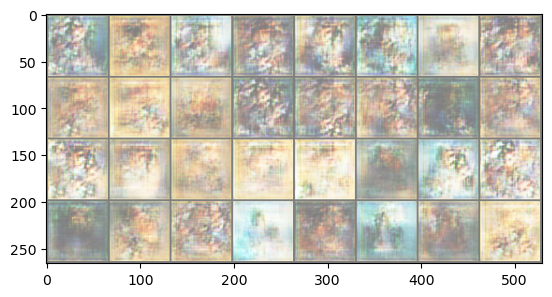

Epoch [261/400] Batch 0/3                   Loss D: 0.5944, loss G: 1.9484 
 Disc Real Prob 0.6411610245704651 Disc Fake Prob 0.6049937605857849
Epoch [262/400] Batch 0/3                   Loss D: 0.5695, loss G: 2.1425 
 Disc Real Prob 0.6356898546218872 Disc Fake Prob 0.5926949381828308
Epoch [263/400] Batch 0/3                   Loss D: 0.6159, loss G: 1.8767 
 Disc Real Prob 0.6354761719703674 Disc Fake Prob 0.6023101806640625
Epoch [264/400] Batch 0/3                   Loss D: 0.5302, loss G: 2.1409 
 Disc Real Prob 0.6507571935653687 Disc Fake Prob 0.5991823673248291
Epoch [265/400] Batch 0/3                   Loss D: 0.6024, loss G: 1.9767 
 Disc Real Prob 0.6397320032119751 Disc Fake Prob 0.6055466532707214
Epoch [266/400] Batch 0/3                   Loss D: 0.5895, loss G: 1.8909 
 Disc Real Prob 0.6285303235054016 Disc Fake Prob 0.5845208764076233
Epoch [267/400] Batch 0/3                   Loss D: 0.5699, loss G: 1.9919 
 Disc Real Prob 0.6408877372741699 Disc Fake Prob 0.59

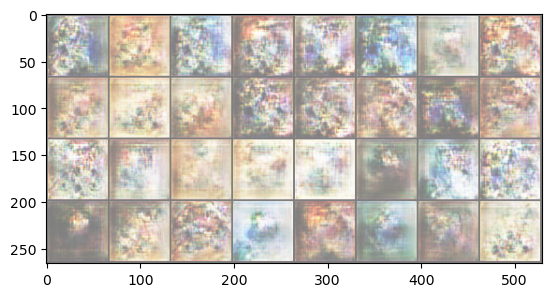

Epoch [271/400] Batch 0/3                   Loss D: 0.6718, loss G: 1.8409 
 Disc Real Prob 0.609022319316864 Disc Fake Prob 0.5845849514007568
Epoch [272/400] Batch 0/3                   Loss D: 0.5819, loss G: 2.1966 
 Disc Real Prob 0.6212183833122253 Disc Fake Prob 0.5781439542770386
Epoch [273/400] Batch 0/3                   Loss D: 0.5233, loss G: 2.4725 
 Disc Real Prob 0.6623032689094543 Disc Fake Prob 0.6042208075523376
Epoch [274/400] Batch 0/3                   Loss D: 0.5645, loss G: 2.1972 
 Disc Real Prob 0.6232101917266846 Disc Fake Prob 0.5748602151870728
Epoch [275/400] Batch 0/3                   Loss D: 0.5193, loss G: 2.4277 
 Disc Real Prob 0.6581405401229858 Disc Fake Prob 0.6023060083389282
Epoch [276/400] Batch 0/3                   Loss D: 0.5528, loss G: 2.0808 
 Disc Real Prob 0.6468866467475891 Disc Fake Prob 0.6003767251968384
Epoch [277/400] Batch 0/3                   Loss D: 0.4317, loss G: 2.1259 
 Disc Real Prob 0.6541121602058411 Disc Fake Prob 0.575

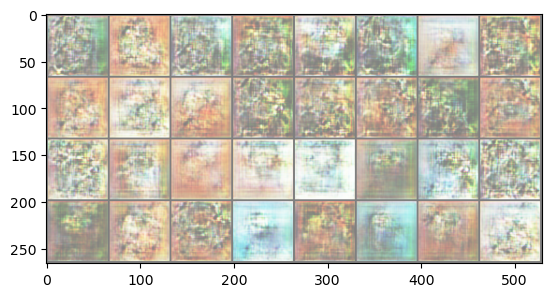

Epoch [281/400] Batch 0/3                   Loss D: 0.6210, loss G: 2.4941 
 Disc Real Prob 0.6440903544425964 Disc Fake Prob 0.6108733415603638
Epoch [282/400] Batch 0/3                   Loss D: 0.6252, loss G: 2.3887 
 Disc Real Prob 0.6677126288414001 Disc Fake Prob 0.6334881782531738
Epoch [283/400] Batch 0/3                   Loss D: 0.5387, loss G: 2.1737 
 Disc Real Prob 0.6448931694030762 Disc Fake Prob 0.5943019390106201
Epoch [284/400] Batch 0/3                   Loss D: 0.5767, loss G: 2.3678 
 Disc Real Prob 0.6456891298294067 Disc Fake Prob 0.5986816883087158
Epoch [285/400] Batch 0/3                   Loss D: 0.5540, loss G: 2.2425 
 Disc Real Prob 0.6651785969734192 Disc Fake Prob 0.6139705777168274
Epoch [286/400] Batch 0/3                   Loss D: 0.6855, loss G: 2.3169 
 Disc Real Prob 0.6458109021186829 Disc Fake Prob 0.623577356338501
Epoch [287/400] Batch 0/3                   Loss D: 0.6091, loss G: 2.0922 
 Disc Real Prob 0.6608824729919434 Disc Fake Prob 0.623

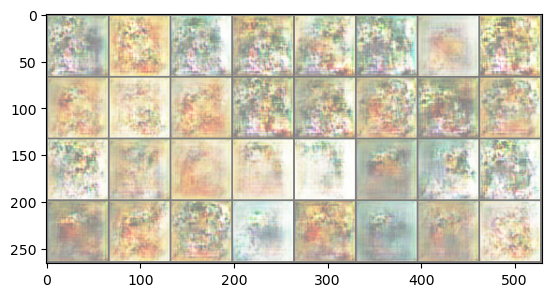

Epoch [291/400] Batch 0/3                   Loss D: 0.4986, loss G: 2.4121 
 Disc Real Prob 0.656509280204773 Disc Fake Prob 0.5950121879577637
Epoch [292/400] Batch 0/3                   Loss D: 0.5652, loss G: 2.2406 
 Disc Real Prob 0.6359761357307434 Disc Fake Prob 0.5840961933135986
Epoch [293/400] Batch 0/3                   Loss D: 0.5664, loss G: 2.2266 
 Disc Real Prob 0.6199089288711548 Disc Fake Prob 0.5660368204116821
Epoch [294/400] Batch 0/3                   Loss D: 0.5726, loss G: 2.7801 
 Disc Real Prob 0.6894083619117737 Disc Fake Prob 0.6371519565582275
Epoch [295/400] Batch 0/3                   Loss D: 0.5252, loss G: 1.8498 
 Disc Real Prob 0.660454273223877 Disc Fake Prob 0.6018795371055603
Epoch [296/400] Batch 0/3                   Loss D: 0.4425, loss G: 1.9250 
 Disc Real Prob 0.6532173752784729 Disc Fake Prob 0.5766400098800659
Epoch [297/400] Batch 0/3                   Loss D: 0.4648, loss G: 2.0389 
 Disc Real Prob 0.6518698334693909 Disc Fake Prob 0.5772

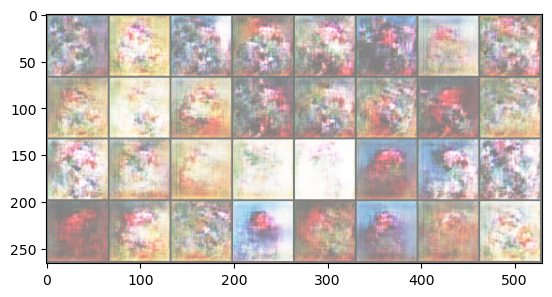

Epoch [301/400] Batch 0/3                   Loss D: 0.5269, loss G: 2.6917 
 Disc Real Prob 0.671414315700531 Disc Fake Prob 0.613210916519165
Epoch [302/400] Batch 0/3                   Loss D: 0.5092, loss G: 2.7968 
 Disc Real Prob 0.6687262058258057 Disc Fake Prob 0.6047235727310181
Epoch [303/400] Batch 0/3                   Loss D: 0.4689, loss G: 2.5135 
 Disc Real Prob 0.670146644115448 Disc Fake Prob 0.5959634780883789
Epoch [304/400] Batch 0/3                   Loss D: 0.5179, loss G: 3.4728 
 Disc Real Prob 0.6753377318382263 Disc Fake Prob 0.6133710145950317
Epoch [305/400] Batch 0/3                   Loss D: 0.6039, loss G: 2.6629 
 Disc Real Prob 0.6990567445755005 Disc Fake Prob 0.6473718285560608
Epoch [306/400] Batch 0/3                   Loss D: 0.5291, loss G: 2.0690 
 Disc Real Prob 0.6555845737457275 Disc Fake Prob 0.5951753258705139
Epoch [307/400] Batch 0/3                   Loss D: 0.5051, loss G: 2.5636 
 Disc Real Prob 0.6594204306602478 Disc Fake Prob 0.59412

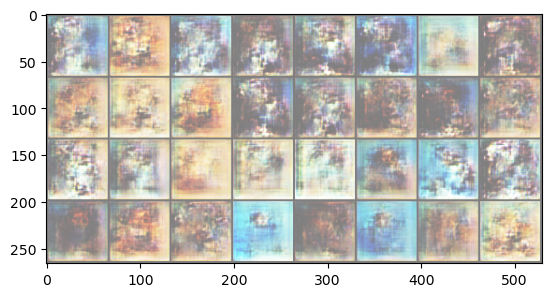

Epoch [311/400] Batch 0/3                   Loss D: 0.4110, loss G: 2.9293 
 Disc Real Prob 0.6751605272293091 Disc Fake Prob 0.5866806507110596
Epoch [312/400] Batch 0/3                   Loss D: 0.5165, loss G: 2.6556 
 Disc Real Prob 0.6674776077270508 Disc Fake Prob 0.6061683893203735
Epoch [313/400] Batch 0/3                   Loss D: 0.6004, loss G: 2.4076 
 Disc Real Prob 0.6685843467712402 Disc Fake Prob 0.6239378452301025
Epoch [314/400] Batch 0/3                   Loss D: 0.5390, loss G: 1.9814 
 Disc Real Prob 0.6583224534988403 Disc Fake Prob 0.6020136475563049
Epoch [315/400] Batch 0/3                   Loss D: 0.4906, loss G: 2.8801 
 Disc Real Prob 0.6678577661514282 Disc Fake Prob 0.603936493396759
Epoch [316/400] Batch 0/3                   Loss D: 0.5230, loss G: 2.6333 
 Disc Real Prob 0.6664119362831116 Disc Fake Prob 0.6047849059104919
Epoch [317/400] Batch 0/3                   Loss D: 0.5197, loss G: 2.0830 
 Disc Real Prob 0.6377871632575989 Disc Fake Prob 0.575

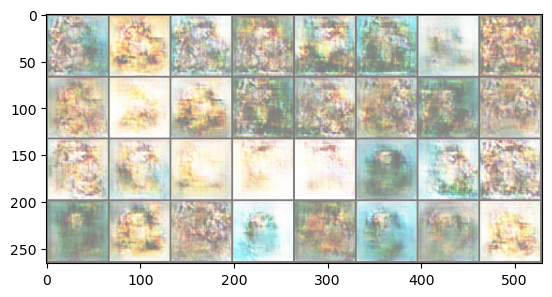

Epoch [321/400] Batch 0/3                   Loss D: 0.5181, loss G: 2.3177 
 Disc Real Prob 0.6619738340377808 Disc Fake Prob 0.5999761819839478
Epoch [322/400] Batch 0/3                   Loss D: 0.4844, loss G: 3.0120 
 Disc Real Prob 0.6944682002067566 Disc Fake Prob 0.6176955103874207
Epoch [323/400] Batch 0/3                   Loss D: 0.5377, loss G: 2.4199 
 Disc Real Prob 0.6541590690612793 Disc Fake Prob 0.5965720415115356
Epoch [324/400] Batch 0/3                   Loss D: 0.5078, loss G: 2.5173 
 Disc Real Prob 0.6447798609733582 Disc Fake Prob 0.5823123455047607
Epoch [325/400] Batch 0/3                   Loss D: 0.6888, loss G: 3.2917 
 Disc Real Prob 0.653589129447937 Disc Fake Prob 0.6259864568710327
Epoch [326/400] Batch 0/3                   Loss D: 0.5578, loss G: 2.5219 
 Disc Real Prob 0.6644994020462036 Disc Fake Prob 0.614505410194397
Epoch [327/400] Batch 0/3                   Loss D: 0.5847, loss G: 3.2384 
 Disc Real Prob 0.687193751335144 Disc Fake Prob 0.63486

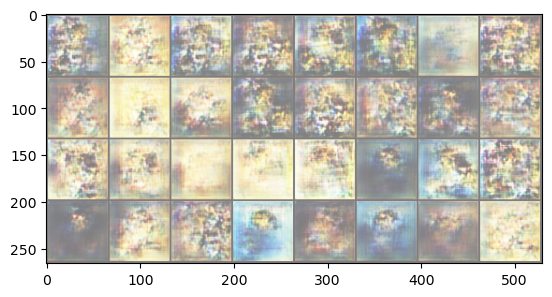

Epoch [331/400] Batch 0/3                   Loss D: 0.5455, loss G: 2.9594 
 Disc Real Prob 0.6765940189361572 Disc Fake Prob 0.6209852695465088
Epoch [332/400] Batch 0/3                   Loss D: 0.3888, loss G: 2.4882 
 Disc Real Prob 0.6735552549362183 Disc Fake Prob 0.5774469971656799
Epoch [333/400] Batch 0/3                   Loss D: 0.4532, loss G: 3.0255 
 Disc Real Prob 0.6699758172035217 Disc Fake Prob 0.5944849848747253
Epoch [334/400] Batch 0/3                   Loss D: 0.4898, loss G: 2.7718 
 Disc Real Prob 0.6878677010536194 Disc Fake Prob 0.6125593185424805
Epoch [335/400] Batch 0/3                   Loss D: 0.5049, loss G: 2.4333 
 Disc Real Prob 0.650912880897522 Disc Fake Prob 0.5836659669876099
Epoch [336/400] Batch 0/3                   Loss D: 0.4724, loss G: 2.4696 
 Disc Real Prob 0.659622848033905 Disc Fake Prob 0.5841102600097656
Epoch [337/400] Batch 0/3                   Loss D: 0.4146, loss G: 2.7004 
 Disc Real Prob 0.6590243577957153 Disc Fake Prob 0.5723

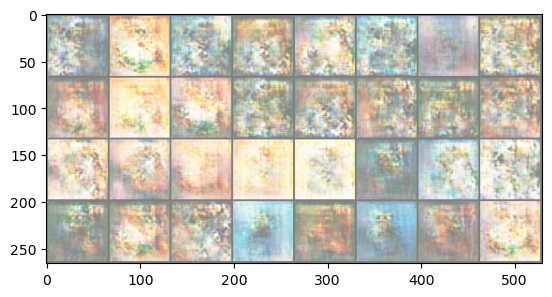

Epoch [341/400] Batch 0/3                   Loss D: 0.5002, loss G: 1.8839 
 Disc Real Prob 0.6469950079917908 Disc Fake Prob 0.5815206170082092
Epoch [342/400] Batch 0/3                   Loss D: 0.4170, loss G: 2.4606 
 Disc Real Prob 0.668326735496521 Disc Fake Prob 0.5787802934646606
Epoch [343/400] Batch 0/3                   Loss D: 0.4364, loss G: 2.5634 
 Disc Real Prob 0.6637548804283142 Disc Fake Prob 0.5812070369720459
Epoch [344/400] Batch 0/3                   Loss D: 0.4362, loss G: 3.2309 
 Disc Real Prob 0.6876013278961182 Disc Fake Prob 0.6046369075775146
Epoch [345/400] Batch 0/3                   Loss D: 0.4448, loss G: 2.9002 
 Disc Real Prob 0.6842426657676697 Disc Fake Prob 0.5999122858047485
Epoch [346/400] Batch 0/3                   Loss D: 0.4921, loss G: 2.8484 
 Disc Real Prob 0.6777873039245605 Disc Fake Prob 0.612911581993103
Epoch [347/400] Batch 0/3                   Loss D: 0.5500, loss G: 2.5882 
 Disc Real Prob 0.6693602800369263 Disc Fake Prob 0.6143

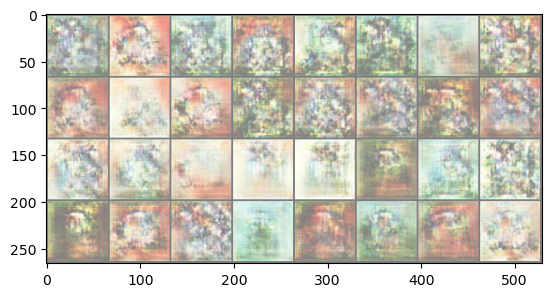

Epoch [351/400] Batch 0/3                   Loss D: 0.4536, loss G: 3.3652 
 Disc Real Prob 0.6716867685317993 Disc Fake Prob 0.5943610668182373
Epoch [352/400] Batch 0/3                   Loss D: 0.4545, loss G: 2.7213 
 Disc Real Prob 0.6406779289245605 Disc Fake Prob 0.5585280656814575
Epoch [353/400] Batch 0/3                   Loss D: 0.4877, loss G: 3.4282 
 Disc Real Prob 0.6599365472793579 Disc Fake Prob 0.5852339863777161
Epoch [354/400] Batch 0/3                   Loss D: 0.4492, loss G: 3.6899 
 Disc Real Prob 0.6934647560119629 Disc Fake Prob 0.6115202903747559
Epoch [355/400] Batch 0/3                   Loss D: 0.5310, loss G: 3.4856 
 Disc Real Prob 0.7030861973762512 Disc Fake Prob 0.6328621506690979
Epoch [356/400] Batch 0/3                   Loss D: 0.4463, loss G: 2.4294 
 Disc Real Prob 0.6516927480697632 Disc Fake Prob 0.56367027759552
Epoch [357/400] Batch 0/3                   Loss D: 0.4292, loss G: 3.2568 
 Disc Real Prob 0.6996842622756958 Disc Fake Prob 0.6102

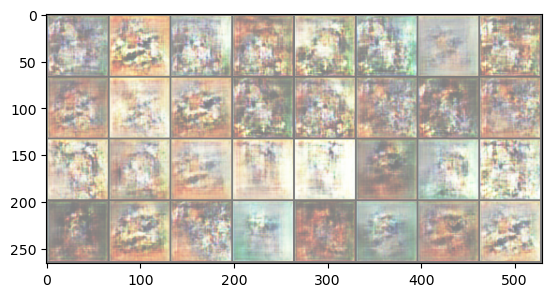

Epoch [361/400] Batch 0/3                   Loss D: 0.4729, loss G: 2.9068 
 Disc Real Prob 0.6523497700691223 Disc Fake Prob 0.5737203359603882
Epoch [362/400] Batch 0/3                   Loss D: 0.4553, loss G: 2.9542 
 Disc Real Prob 0.6432153582572937 Disc Fake Prob 0.564354658126831
Epoch [363/400] Batch 0/3                   Loss D: 0.3510, loss G: 2.9830 
 Disc Real Prob 0.6761860847473145 Disc Fake Prob 0.5723648071289062
Epoch [364/400] Batch 0/3                   Loss D: 0.5223, loss G: 3.5749 
 Disc Real Prob 0.6829630136489868 Disc Fake Prob 0.6126499176025391
Epoch [365/400] Batch 0/3                   Loss D: 0.4455, loss G: 2.6853 
 Disc Real Prob 0.6656639575958252 Disc Fake Prob 0.5874457955360413
Epoch [366/400] Batch 0/3                   Loss D: 0.3930, loss G: 3.3942 
 Disc Real Prob 0.6918752193450928 Disc Fake Prob 0.5979862213134766
Epoch [367/400] Batch 0/3                   Loss D: 0.4202, loss G: 2.8454 
 Disc Real Prob 0.6821990013122559 Disc Fake Prob 0.595

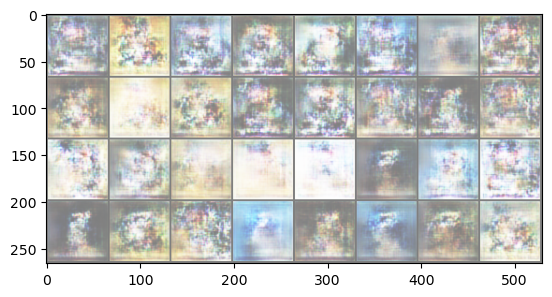

Epoch [371/400] Batch 0/3                   Loss D: 0.4075, loss G: 2.9811 
 Disc Real Prob 0.6621823310852051 Disc Fake Prob 0.5702195167541504
Epoch [372/400] Batch 0/3                   Loss D: 0.4104, loss G: 3.0817 
 Disc Real Prob 0.6566516160964966 Disc Fake Prob 0.5624996423721313
Epoch [373/400] Batch 0/3                   Loss D: 0.4287, loss G: 3.4527 
 Disc Real Prob 0.6755340099334717 Disc Fake Prob 0.5878983736038208
Epoch [374/400] Batch 0/3                   Loss D: 0.4511, loss G: 3.4382 
 Disc Real Prob 0.6805311441421509 Disc Fake Prob 0.5947183966636658
Epoch [375/400] Batch 0/3                   Loss D: 0.3949, loss G: 2.3360 
 Disc Real Prob 0.6466072797775269 Disc Fake Prob 0.5464051961898804
Epoch [376/400] Batch 0/3                   Loss D: 0.4383, loss G: 2.3535 
 Disc Real Prob 0.6421375274658203 Disc Fake Prob 0.5559729337692261
Epoch [377/400] Batch 0/3                   Loss D: 0.3912, loss G: 2.7645 
 Disc Real Prob 0.6745662093162537 Disc Fake Prob 0.57

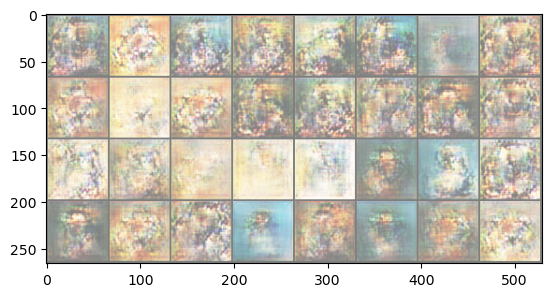

Epoch [381/400] Batch 0/3                   Loss D: 0.4174, loss G: 3.5277 
 Disc Real Prob 0.6826561689376831 Disc Fake Prob 0.593380331993103
Epoch [382/400] Batch 0/3                   Loss D: 0.3392, loss G: 3.7227 
 Disc Real Prob 0.6852977275848389 Disc Fake Prob 0.5737875699996948
Epoch [383/400] Batch 0/3                   Loss D: 0.3882, loss G: 3.3745 
 Disc Real Prob 0.7031458616256714 Disc Fake Prob 0.6041719913482666
Epoch [384/400] Batch 0/3                   Loss D: 0.4425, loss G: 2.9725 
 Disc Real Prob 0.6581531763076782 Disc Fake Prob 0.5740057229995728
Epoch [385/400] Batch 0/3                   Loss D: 0.4494, loss G: 3.7989 
 Disc Real Prob 0.6896848678588867 Disc Fake Prob 0.5999270081520081
Epoch [386/400] Batch 0/3                   Loss D: 0.4227, loss G: 2.8949 
 Disc Real Prob 0.6603766083717346 Disc Fake Prob 0.571677029132843
Epoch [387/400] Batch 0/3                   Loss D: 0.4055, loss G: 3.3071 
 Disc Real Prob 0.6890814900398254 Disc Fake Prob 0.5952

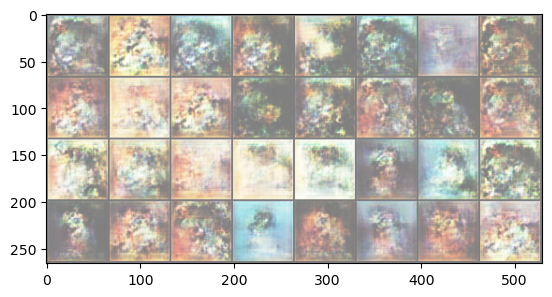

Epoch [391/400] Batch 0/3                   Loss D: 0.4086, loss G: 3.2429 
 Disc Real Prob 0.6817264556884766 Disc Fake Prob 0.5832397937774658
Epoch [392/400] Batch 0/3                   Loss D: 0.4114, loss G: 2.7955 
 Disc Real Prob 0.6563606262207031 Disc Fake Prob 0.5628906488418579
Epoch [393/400] Batch 0/3                   Loss D: 0.3874, loss G: 3.1347 
 Disc Real Prob 0.6452777981758118 Disc Fake Prob 0.5420656204223633
Epoch [394/400] Batch 0/3                   Loss D: 0.3676, loss G: 3.6667 
 Disc Real Prob 0.6740748882293701 Disc Fake Prob 0.5681564807891846
Epoch [395/400] Batch 0/3                   Loss D: 0.5238, loss G: 4.5962 
 Disc Real Prob 0.7026200294494629 Disc Fake Prob 0.6168762445449829
Epoch [396/400] Batch 0/3                   Loss D: 0.3285, loss G: 3.4326 
 Disc Real Prob 0.6885102391242981 Disc Fake Prob 0.5726816654205322
Epoch [397/400] Batch 0/3                   Loss D: 0.3873, loss G: 3.6266 
 Disc Real Prob 0.6877225637435913 Disc Fake Prob 0.58

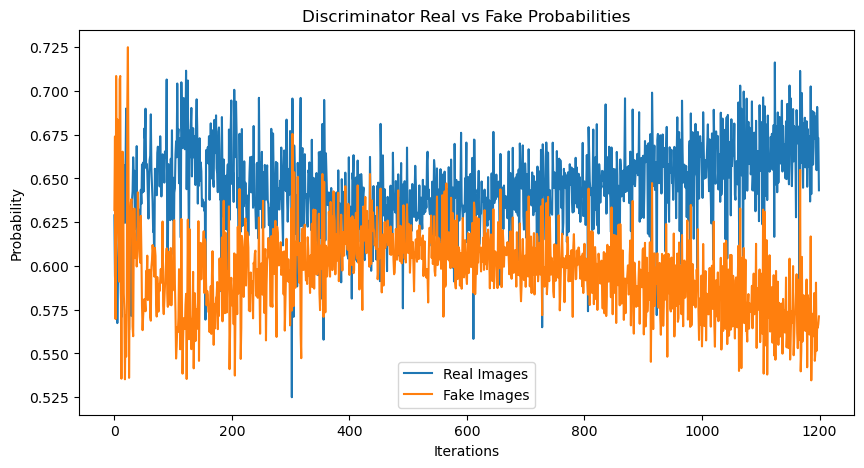

In [11]:
# Initialize lists to store discriminator probabilities for real and fake images
disc_real_probs = []
disc_fake_probs = []

# Training loop
gen.train()
disc.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _ ) in enumerate(dataloader):
        real = real.to(device)
        
        ### create noise tensor
        noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        disc_fake = disc(fake.detach()).reshape(-1)
        
        #converted prob
        real_prob = torch.sigmoid(disc_real).mean().item()
        fake_prob = torch.sigmoid(disc_fake).mean().item()

        # Store the discriminator probabilities for real and fake images
        disc_real_probs.append(real_prob)
        disc_fake_probs.append(fake_prob)
        
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        ### Print losses occasionally and fake images occasionally
        if batch_idx % 50 == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f} \n Disc Real Prob {real_prob} Disc Fake Prob {fake_prob}"
            )
            if epoch % 10 == 0: 
                with torch.no_grad():
                    fake = gen(fixed_noise)
                    img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                    img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                    show_tensor_images(img_grid_fake)
            
        

# Plotting the probabilities
plt.figure(figsize=(10, 5))
plt.title("Discriminator Real vs Fake Probabilities")
plt.plot(disc_real_probs, label="Real Images")
plt.plot(disc_fake_probs, label="Fake Images")
plt.xlabel("Iterations")
plt.ylabel("Probability")
plt.legend()
plt.show()


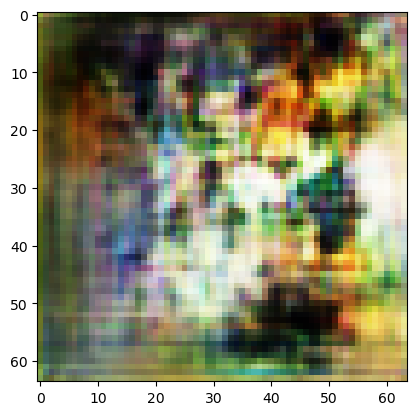

In [15]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(1, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=1)


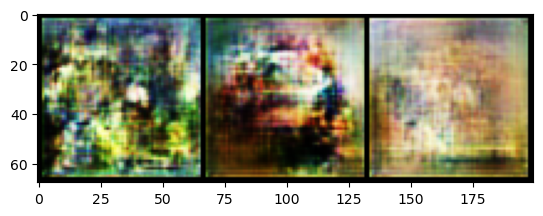

In [24]:
# Generate a single new image
z_dim = Z_DIM  # Ensure this matches the latent dimension you used during training
single_noise = torch.randn(3, z_dim, 1, 1).to(device)  # Batch size of 1 for a single image
with torch.no_grad():  # No need to compute gradients for generation
    generated_image = gen(single_noise).detach().cpu()  # Pass noise through generator

# Convert to a displayable format and show/save
show_tensor_images(generated_image, num_images=3)